In [0]:
!wget https://www.dropbox.com/s/u2r11zzjru49ndw/data.zip?dl=0

--2020-01-05 20:12:09--  https://www.dropbox.com/s/u2r11zzjru49ndw/data.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.1, 2620:100:6021:1::a27d:4101
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/u2r11zzjru49ndw/data.zip [following]
--2020-01-05 20:12:09--  https://www.dropbox.com/s/raw/u2r11zzjru49ndw/data.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uccbc4b400eb20406d1f5514e61a.dl.dropboxusercontent.com/cd/0/inline/AvkeDM9VKdCGzsMXdLC_cvPlnKHJfcwLQ40zyGkW3RsAvCmWvxzr74XE27qPoYqMBux4PmZ8G2cnYiN8NDR9UNs_JMD-TwVrd4ucL2Vu3d2QJJ7gm9T3XxyEvdC1XFVVomo/file# [following]
--2020-01-05 20:12:09--  https://uccbc4b400eb20406d1f5514e61a.dl.dropboxusercontent.com/cd/0/inline/AvkeDM9VKdCGzsMXdLC_cvPlnKHJfcwLQ40zyGkW3RsAvCmWvxzr74XE27qPoYqMBux4PmZ8G2cnYiN8NDR9UNs_JMD-TwVrd4ucL2Vu3d2QJJ7gm9T3Xx

In [0]:
!unzip data.zip?dl=0 -d "Train/"

Archive:  data.zip?dl=0
  inflating: Train/data/000001.jpg   
  inflating: Train/data/000002.jpg   
  inflating: Train/data/000003.jpg   
  inflating: Train/data/000004.jpg   
  inflating: Train/data/000005.jpg   
  inflating: Train/data/000006.jpg   
  inflating: Train/data/000007.jpg   
  inflating: Train/data/000008.jpg   
  inflating: Train/data/000009.jpg   
  inflating: Train/data/000010.jpg   
  inflating: Train/data/000011.jpg   
  inflating: Train/data/000012.jpg   
  inflating: Train/data/000013.jpg   
  inflating: Train/data/000014.jpg   
  inflating: Train/data/000015.jpg   
  inflating: Train/data/000016.jpg   
  inflating: Train/data/000017.jpg   
  inflating: Train/data/000018.jpg   
  inflating: Train/data/000019.jpg   
  inflating: Train/data/000020.jpg   
  inflating: Train/data/000021.jpg   
  inflating: Train/data/000022.jpg   
  inflating: Train/data/000023.jpg   
  inflating: Train/data/000024.jpg   
  inflating: Train/data/000025.jpg   
  inflating: Train/data/00

In [0]:
from keras.preprocessing import image
import matplotlib.pyplot as plt

In [0]:
def readImage(path):
  img=image.load_img(path,target_size=(32,32))
  img_array=image.img_to_array(img)
  img_array/=255.0
  #plt.axis('off')
  #plt.imshow(img_array)
  #plt.show()
  return img_array

In [0]:
import os
path=os.path.join('Train','data')

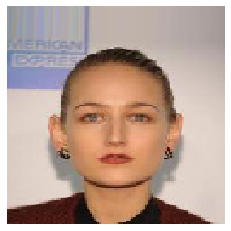

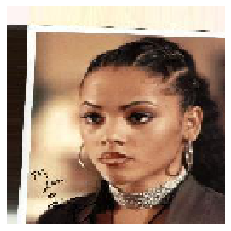

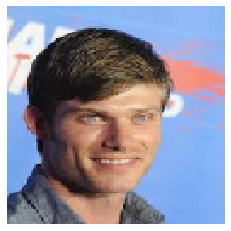

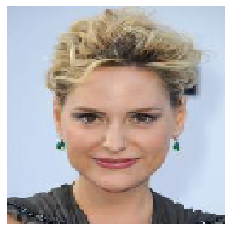

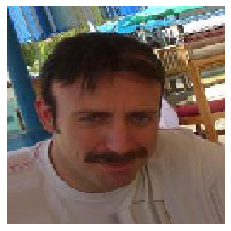

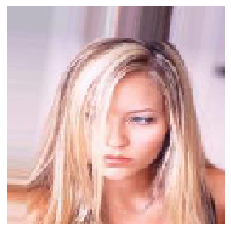

In [0]:
count=0
for imgs in os.listdir(path):
  readImage(os.path.join(path,imgs))
  if count==5:
    break
  count+=1

In [0]:
train_data=[]
for imgs in os.listdir(path):
  array=readImage(os.path.join(path,imgs))
  train_data.append(array)

In [0]:
import numpy as np
train_data=np.array(train_data)

In [0]:
train_data=((train_data.astype('float32')-127.5)/127.5)

In [0]:
print(train_data.max())
print(train_data.min())

1.0
0.0


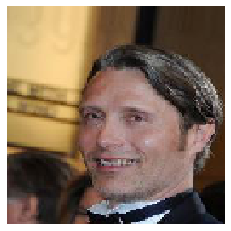

In [0]:
plt.axis('off')
plt.imshow(train_data[10])
plt.show()

In [0]:
from keras.layers import *
from keras.layers.advanced_activations import LeakyReLU
from keras.models import Sequential,Model
from keras.optimizers import Adam,RMSprop,SGD
import matplotlib.pyplot as plt
import numpy as np
import math

In [0]:
# lets define some parameters:
NUM_EPOCHS=500
BATCH_SIZE=64
HALF_BATCH_SIZE=int(BATCH_SIZE/2)
NO_OF_BATCHES=math.ceil(train_data.shape[0]/BATCH_SIZE)
adam=Adam(lr=2e-4,beta_1=0.5)
#adam=Adam(lr=0.00004,beta_1=0.5)
NOISE_DIM=100

In [0]:
# lets construct our generator:
generator=Sequential()

generator.add(Dense(8*8*128,input_shape=(NOISE_DIM,)))
generator.add(Reshape((8,8,128)))
generator.add(LeakyReLU(0.2))
generator.add(BatchNormalization())


generator.add(Conv2DTranspose(64, kernel_size=(5,5), padding='same', strides=(2,2)))
#generator.add(Conv2D(64,kernel_size=(5,5),padding='same')) # 16,16,64
generator.add(LeakyReLU(0.2))
generator.add(BatchNormalization())

generator.add(Conv2DTranspose(3, kernel_size=(5,5), padding='same', strides=(2,2),activation='tanh'))
#generator.add(Conv2D(3,kernel_size=(5,5),padding='same',activation='tanh')) 


generator.compile(loss='binary_crossentropy',optimizer=adam)
generator.summary()
















Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 8192)              827392    
_________________________________________________________________
reshape_1 (Reshape)          (None, 8, 8, 128)         0         
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 16, 16, 64)        204864    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 16, 16, 64)        0         
_____________

In [0]:
# lets construct our discriminator
discriminator=Sequential()
discriminator.add(Conv2D(64,strides=(2,2),padding='same',input_shape=(32,32,3),kernel_size=(5,5)))
discriminator.add(LeakyReLU(0.2))
discriminator.add(BatchNormalization())

discriminator.add(Conv2D(128,strides=(2,2),padding='same',kernel_size=(5,5)))
discriminator.add(LeakyReLU(0.2))
discriminator.add(BatchNormalization())

discriminator.add(Conv2D(256,strides=(2,2),padding='same',kernel_size=(5,5)))
discriminator.add(LeakyReLU(0.2))
discriminator.add(BatchNormalization())

discriminator.add(Conv2D(512,strides=(2,2),padding='same',kernel_size=(5,5)))
discriminator.add(LeakyReLU(0.2))
discriminator.add(BatchNormalization())

discriminator.add(Flatten())
discriminator.add(Dense(1,activation='sigmoid'))

discriminator.compile(loss='binary_crossentropy',optimizer=adam)
discriminator.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
batch_normalization_3 (Batch (None, 16, 16, 64)        256       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 4, 4, 256)        

In [0]:
# GAN
discriminator.trainable=False
gan_input=Input(shape=(NOISE_DIM,))
generated_img=generator(gan_input)
gan_output=discriminator(generated_img)

# functional API
model=Model(gan_input,gan_output)
model.compile(loss='binary_crossentropy',optimizer=adam)

In [0]:
import os
#os.mkdir('images')
def save_imgs(epoch,samples=100):
    
    noise = np.random.normal(0,1,size=(samples,100))
    generated_imgs = generator.predict(noise)
    generated_imgs = generated_imgs.reshape(samples,32,32,3)
    
    plt.figure(figsize=(10,10))
    for i in range(samples):
        plt.subplot(10,10,i+1)
        #plt.imshow(generated_imgs[i],interpolation='nearest',cmap='gray')
        plt.imshow(generated_imgs[i],interpolation='nearest')
        plt.axis("off")
        
    plt.tight_layout()
    plt.savefig('images/gan_output_epoch_{0}.png'.format(epoch+1))
    plt.show()

In [0]:
#from sklearn.utils import shuffle
#train_data=shuffle(train_data)

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch 1 Discriminator loss 0.2557  Generator loss 3.9951
Epoch 2 Discriminator loss 0.2455  Generator loss 4.1976
Epoch 3 Discriminator loss 0.2530  Generator loss 4.5644
Epoch 4 Discriminator loss 0.2297  Generator loss 4.1196
Epoch 5 Discriminator loss 0.2745  Generator loss 4.2656
Epoch 6 Discriminator loss 0.2369  Generator loss 4.2701
Epoch 7 Discriminator loss 0.2485  Generator loss 4.3397
Epoch 8 Discriminator loss 0.2330  Generator loss 4.5164
Epoch 9 Discriminator loss 0.2420  Generator loss 4.3247


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 10 Discriminator loss 0.2333  Generator loss 4.4298


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

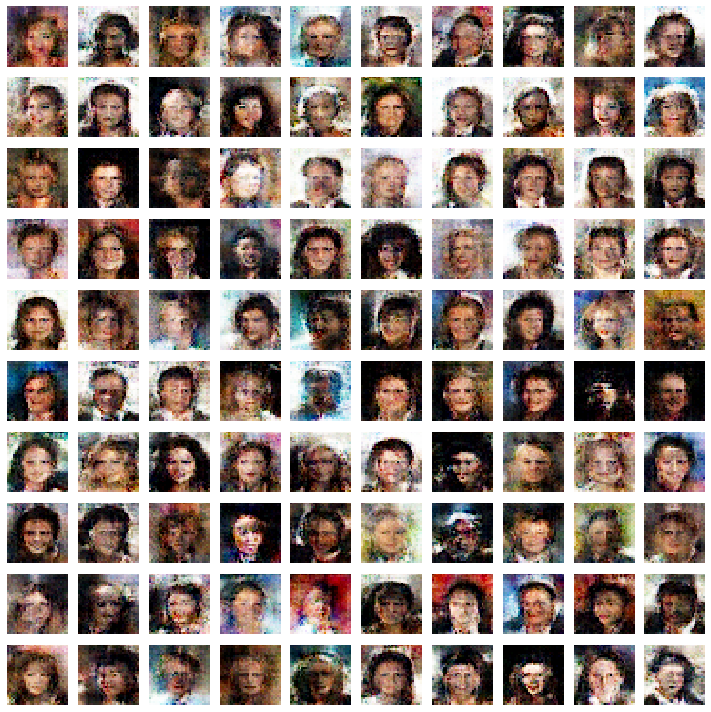

Epoch 11 Discriminator loss 0.2710  Generator loss 4.0961
Epoch 12 Discriminator loss 0.2302  Generator loss 4.6121
Epoch 13 Discriminator loss 0.2397  Generator loss 4.5801
Epoch 14 Discriminator loss 0.2327  Generator loss 4.2954
Epoch 15 Discriminator loss 0.2294  Generator loss 4.8184
Epoch 16 Discriminator loss 0.2483  Generator loss 4.4379
Epoch 17 Discriminator loss 0.2518  Generator loss 4.2817
Epoch 18 Discriminator loss 0.2261  Generator loss 4.3438
Epoch 19 Discriminator loss 0.2435  Generator loss 4.3302


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 20 Discriminator loss 0.2263  Generator loss 4.7105


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

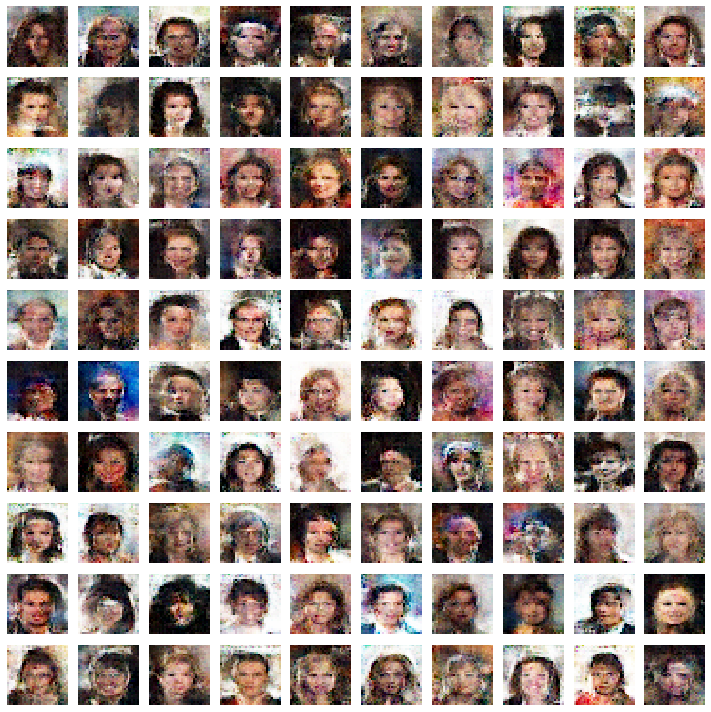

Epoch 21 Discriminator loss 0.2497  Generator loss 4.5289
Epoch 22 Discriminator loss 0.2299  Generator loss 4.6821
Epoch 23 Discriminator loss 0.2514  Generator loss 4.4293
Epoch 24 Discriminator loss 0.2205  Generator loss 4.5193
Epoch 25 Discriminator loss 0.2412  Generator loss 4.5844
Epoch 26 Discriminator loss 0.2206  Generator loss 4.6215
Epoch 27 Discriminator loss 0.2338  Generator loss 4.4065
Epoch 28 Discriminator loss 0.2342  Generator loss 4.3812
Epoch 29 Discriminator loss 0.2235  Generator loss 4.6858


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 30 Discriminator loss 0.2334  Generator loss 4.3588


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

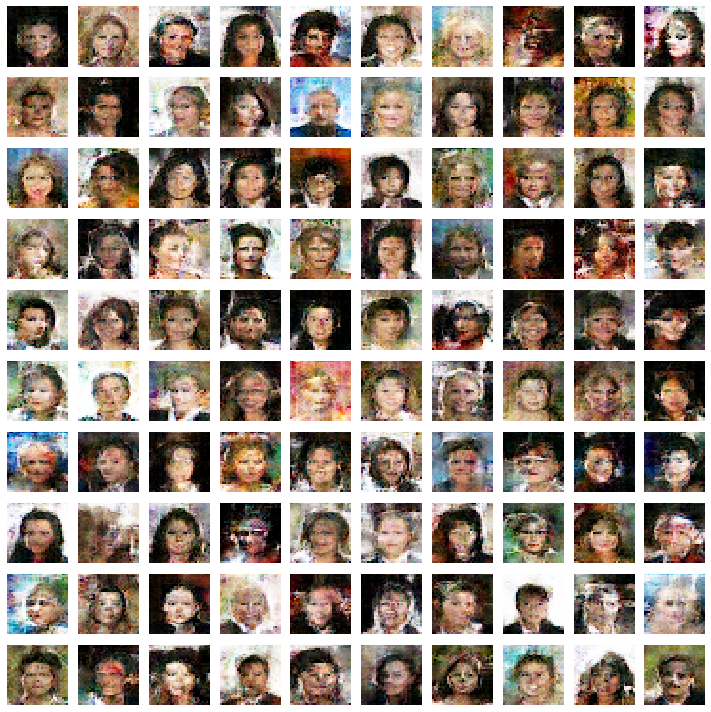

Epoch 31 Discriminator loss 0.2299  Generator loss 4.7790
Epoch 32 Discriminator loss 0.2715  Generator loss 4.2510
Epoch 33 Discriminator loss 0.2423  Generator loss 4.3509
Epoch 34 Discriminator loss 0.2468  Generator loss 4.3678
Epoch 35 Discriminator loss 0.2166  Generator loss 4.5249
Epoch 36 Discriminator loss 0.2264  Generator loss 4.5254
Epoch 37 Discriminator loss 0.2273  Generator loss 4.5417
Epoch 38 Discriminator loss 0.2290  Generator loss 4.7857
Epoch 39 Discriminator loss 0.2401  Generator loss 4.2911


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 40 Discriminator loss 0.2145  Generator loss 4.8836


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

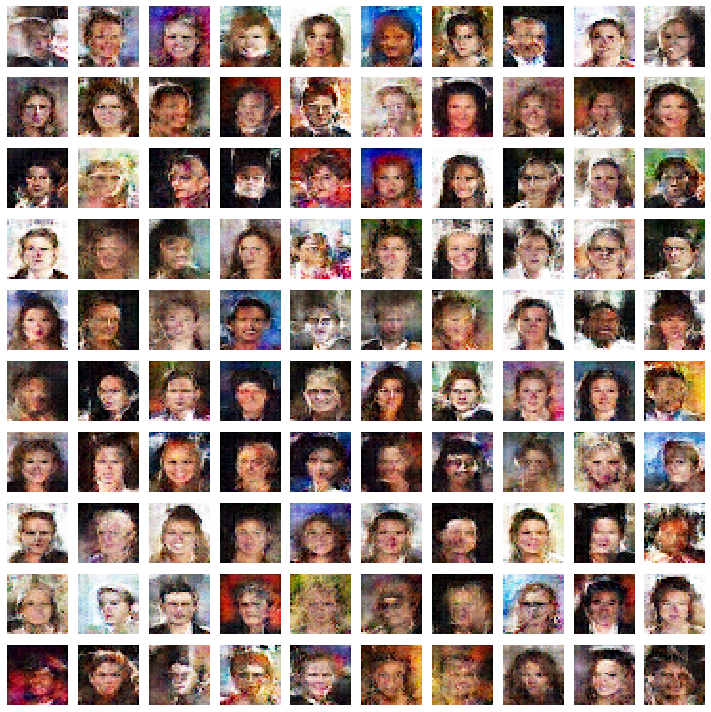

Epoch 41 Discriminator loss 0.2274  Generator loss 4.5305
Epoch 42 Discriminator loss 0.2166  Generator loss 4.5353
Epoch 43 Discriminator loss 0.2288  Generator loss 4.7281
Epoch 44 Discriminator loss 0.2346  Generator loss 4.1870
Epoch 45 Discriminator loss 0.2278  Generator loss 4.4156
Epoch 46 Discriminator loss 0.2227  Generator loss 4.5692
Epoch 47 Discriminator loss 0.2081  Generator loss 4.8943
Epoch 48 Discriminator loss 0.2555  Generator loss 4.2957
Epoch 49 Discriminator loss 0.2474  Generator loss 4.1101


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 50 Discriminator loss 0.2233  Generator loss 4.4533


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

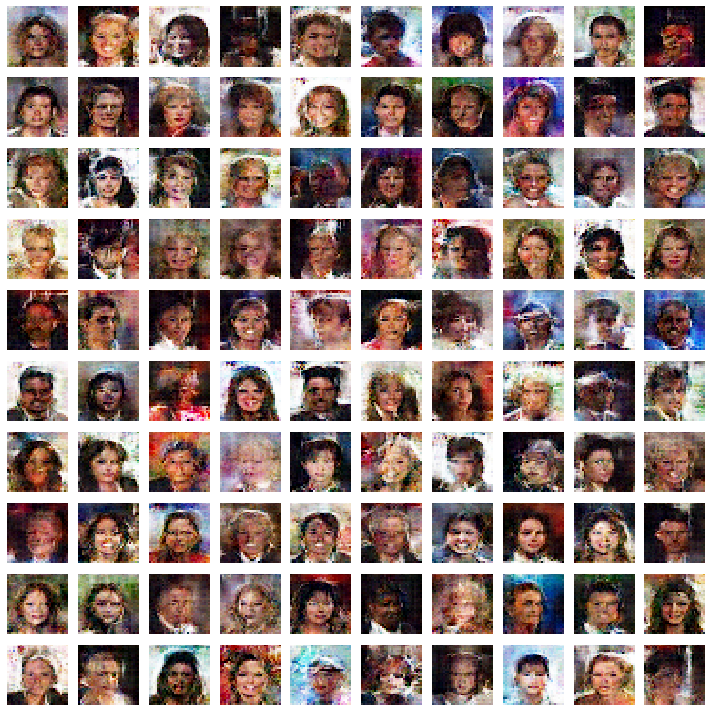

Epoch 51 Discriminator loss 0.2443  Generator loss 4.4610
Epoch 52 Discriminator loss 0.2040  Generator loss 4.4436
Epoch 53 Discriminator loss 0.2151  Generator loss 4.7082
Epoch 54 Discriminator loss 0.2391  Generator loss 4.4191
Epoch 55 Discriminator loss 0.1940  Generator loss 4.6086
Epoch 56 Discriminator loss 0.2248  Generator loss 4.7562
Epoch 57 Discriminator loss 0.2232  Generator loss 4.7491
Epoch 58 Discriminator loss 0.2296  Generator loss 4.6360
Epoch 59 Discriminator loss 0.2105  Generator loss 4.5175


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 60 Discriminator loss 0.2557  Generator loss 4.5121


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

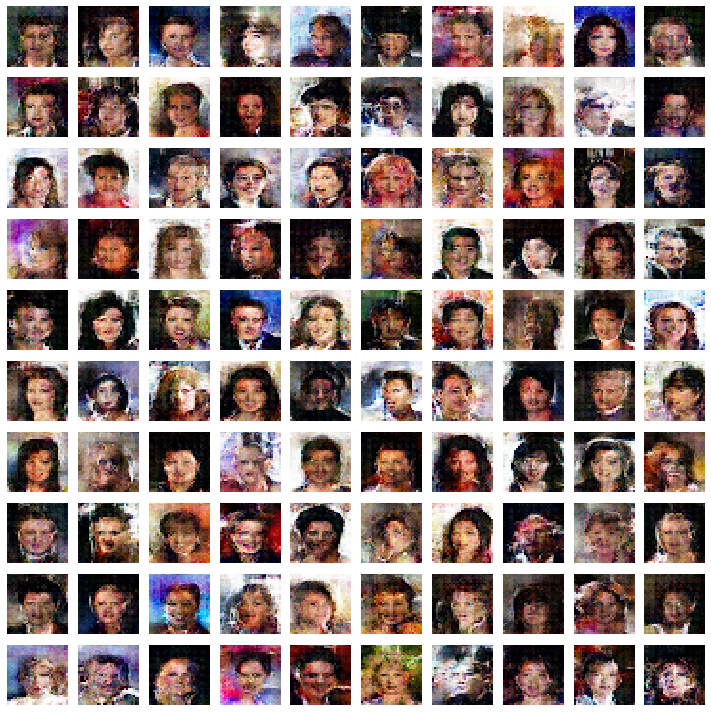

Epoch 61 Discriminator loss 0.2252  Generator loss 4.4667
Epoch 62 Discriminator loss 0.2547  Generator loss 4.3811
Epoch 63 Discriminator loss 0.2261  Generator loss 4.4090
Epoch 64 Discriminator loss 0.2238  Generator loss 4.4341
Epoch 65 Discriminator loss 0.2030  Generator loss 4.7961
Epoch 66 Discriminator loss 0.2221  Generator loss 4.5625
Epoch 67 Discriminator loss 0.1950  Generator loss 4.7587
Epoch 68 Discriminator loss 0.2616  Generator loss 4.1995
Epoch 69 Discriminator loss 0.2324  Generator loss 4.5302


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 70 Discriminator loss 0.2049  Generator loss 4.5602


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

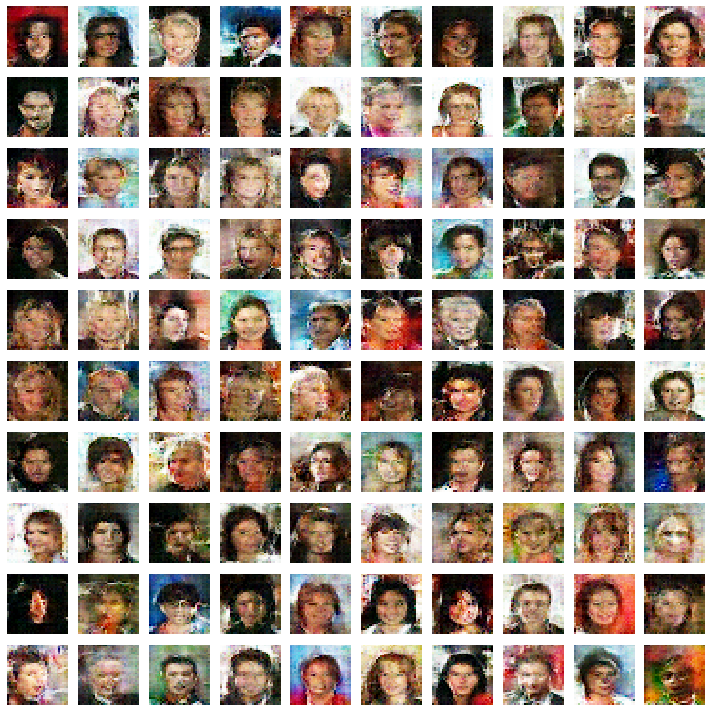

Epoch 71 Discriminator loss 0.2238  Generator loss 4.4817
Epoch 72 Discriminator loss 0.2241  Generator loss 4.7425
Epoch 73 Discriminator loss 0.2201  Generator loss 4.5104
Epoch 74 Discriminator loss 0.2070  Generator loss 4.4456
Epoch 75 Discriminator loss 0.2299  Generator loss 4.4723
Epoch 76 Discriminator loss 0.2034  Generator loss 4.5266
Epoch 77 Discriminator loss 0.2165  Generator loss 4.7445
Epoch 78 Discriminator loss 0.2135  Generator loss 4.6597
Epoch 79 Discriminator loss 0.2015  Generator loss 4.9746


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 80 Discriminator loss 0.2118  Generator loss 4.7657


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

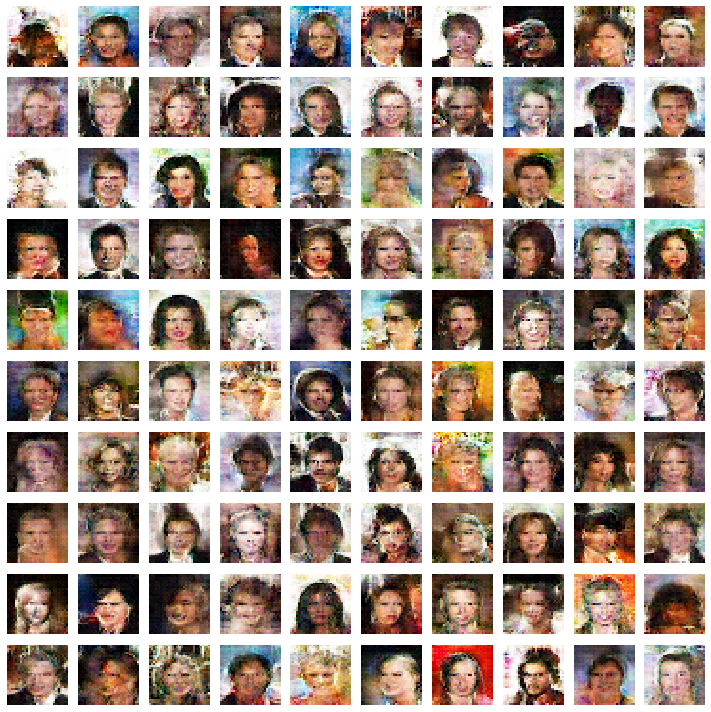

Epoch 81 Discriminator loss 0.1986  Generator loss 5.0302
Epoch 82 Discriminator loss 0.2341  Generator loss 4.5408
Epoch 83 Discriminator loss 0.2104  Generator loss 4.8664
Epoch 84 Discriminator loss 0.2277  Generator loss 4.6770
Epoch 85 Discriminator loss 0.2106  Generator loss 4.8218
Epoch 86 Discriminator loss 0.1981  Generator loss 5.0199
Epoch 87 Discriminator loss 0.2031  Generator loss 4.9145
Epoch 88 Discriminator loss 0.2228  Generator loss 4.7120
Epoch 89 Discriminator loss 0.2268  Generator loss 4.4510


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 90 Discriminator loss 0.1992  Generator loss 4.7780


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

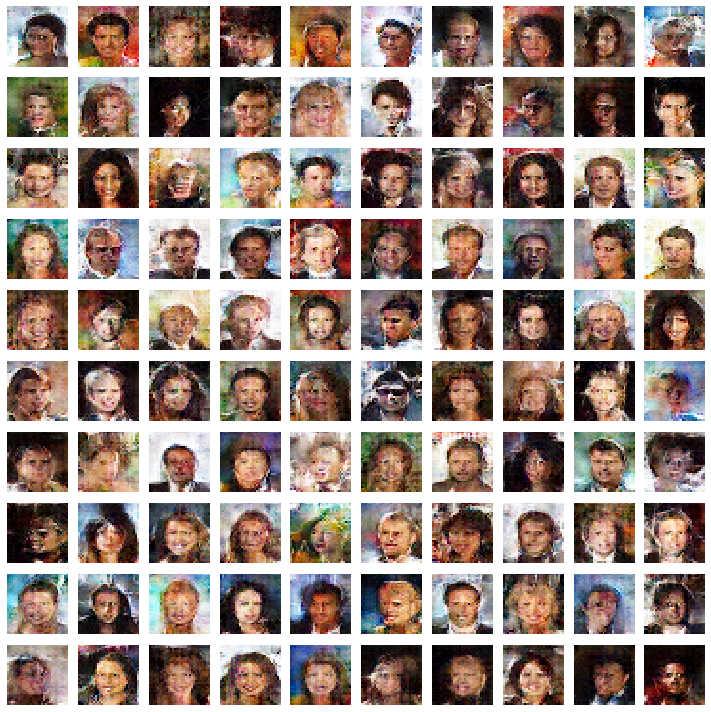

Epoch 91 Discriminator loss 0.1961  Generator loss 5.0140
Epoch 92 Discriminator loss 0.2136  Generator loss 4.8558
Epoch 93 Discriminator loss 0.2094  Generator loss 4.6936
Epoch 94 Discriminator loss 0.2297  Generator loss 4.5453
Epoch 95 Discriminator loss 0.2413  Generator loss 4.2186
Epoch 96 Discriminator loss 0.2001  Generator loss 4.6721
Epoch 97 Discriminator loss 0.1947  Generator loss 5.2069
Epoch 98 Discriminator loss 0.2282  Generator loss 4.3785
Epoch 99 Discriminator loss 0.2069  Generator loss 4.7545


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 100 Discriminator loss 0.1986  Generator loss 5.2346


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

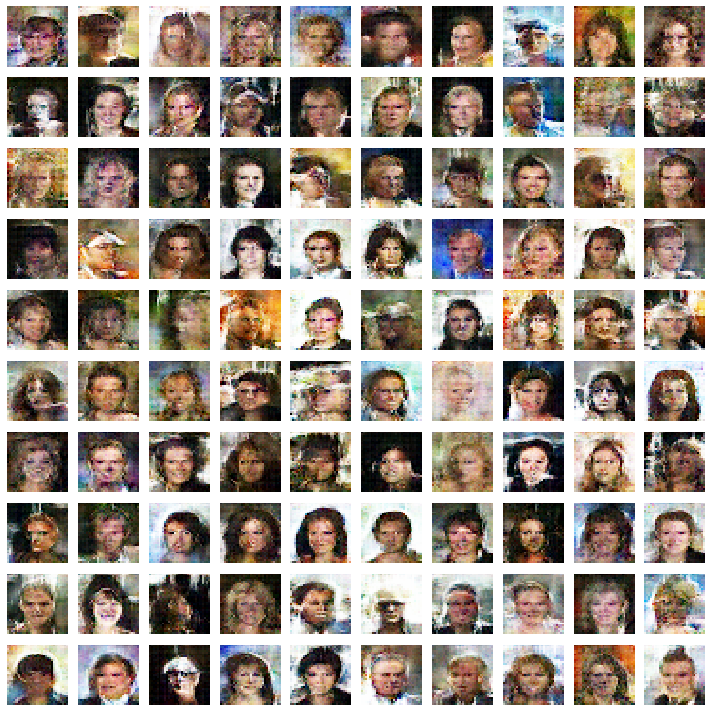

Epoch 101 Discriminator loss 0.2148  Generator loss 4.4236
Epoch 102 Discriminator loss 0.2074  Generator loss 4.8271
Epoch 103 Discriminator loss 0.2149  Generator loss 4.7336
Epoch 104 Discriminator loss 0.2355  Generator loss 4.1896
Epoch 105 Discriminator loss 0.2170  Generator loss 4.6496
Epoch 106 Discriminator loss 0.2080  Generator loss 4.7914
Epoch 107 Discriminator loss 0.2083  Generator loss 5.0477
Epoch 108 Discriminator loss 0.2117  Generator loss 4.7373
Epoch 109 Discriminator loss 0.2019  Generator loss 4.9699


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 110 Discriminator loss 0.1871  Generator loss 5.6398


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

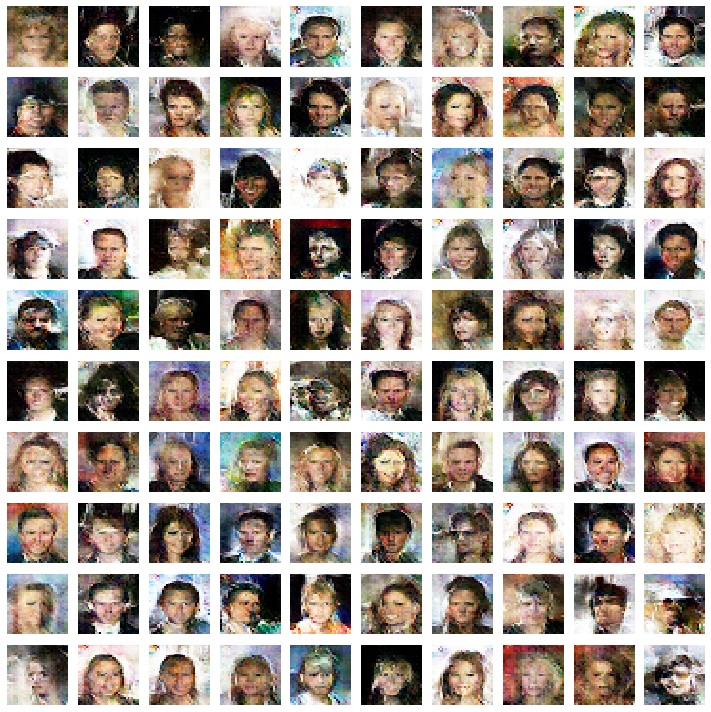

Epoch 111 Discriminator loss 0.1868  Generator loss 5.3686
Epoch 112 Discriminator loss 0.1998  Generator loss 5.1405
Epoch 113 Discriminator loss 0.2351  Generator loss 4.3693
Epoch 114 Discriminator loss 0.2003  Generator loss 5.0493
Epoch 115 Discriminator loss 0.2087  Generator loss 4.6546
Epoch 116 Discriminator loss 0.2028  Generator loss 4.9329
Epoch 117 Discriminator loss 0.2230  Generator loss 4.8709
Epoch 118 Discriminator loss 0.1986  Generator loss 4.9756
Epoch 119 Discriminator loss 0.1982  Generator loss 5.2124


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 120 Discriminator loss 0.1875  Generator loss 5.3620


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

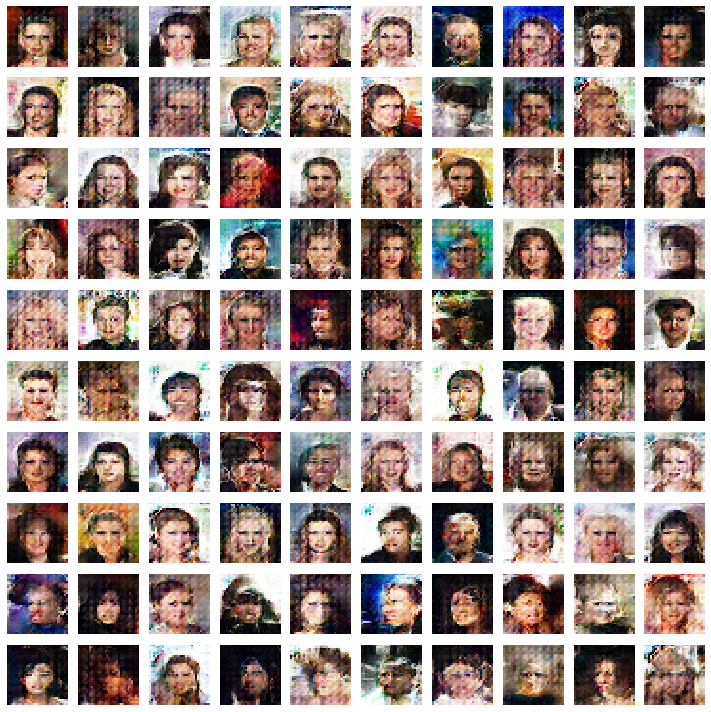

Epoch 121 Discriminator loss 0.2115  Generator loss 4.9455
Epoch 122 Discriminator loss 0.2038  Generator loss 4.8424
Epoch 123 Discriminator loss 0.1815  Generator loss 5.5278
Epoch 124 Discriminator loss 0.2133  Generator loss 5.5762
Epoch 125 Discriminator loss 0.2222  Generator loss 4.4191
Epoch 126 Discriminator loss 0.2096  Generator loss 4.5696
Epoch 127 Discriminator loss 0.1974  Generator loss 4.9456
Epoch 128 Discriminator loss 0.2000  Generator loss 5.4865
Epoch 129 Discriminator loss 0.2010  Generator loss 4.8566


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 130 Discriminator loss 0.1926  Generator loss 5.6763


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

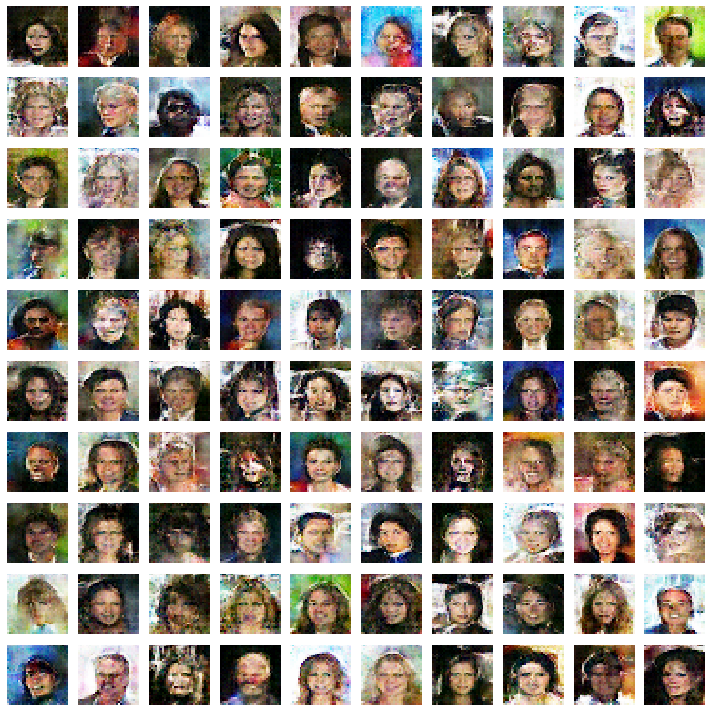

Epoch 131 Discriminator loss 0.1934  Generator loss 5.3455
Epoch 132 Discriminator loss 0.1995  Generator loss 5.2356
Epoch 133 Discriminator loss 0.1916  Generator loss 5.1332
Epoch 134 Discriminator loss 0.1999  Generator loss 5.1893
Epoch 135 Discriminator loss 0.1918  Generator loss 5.3333
Epoch 136 Discriminator loss 0.1852  Generator loss 5.5395
Epoch 137 Discriminator loss 0.1891  Generator loss 5.6947
Epoch 138 Discriminator loss 0.2018  Generator loss 4.8121
Epoch 139 Discriminator loss 0.2268  Generator loss 4.5699


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 140 Discriminator loss 0.2057  Generator loss 4.8651


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

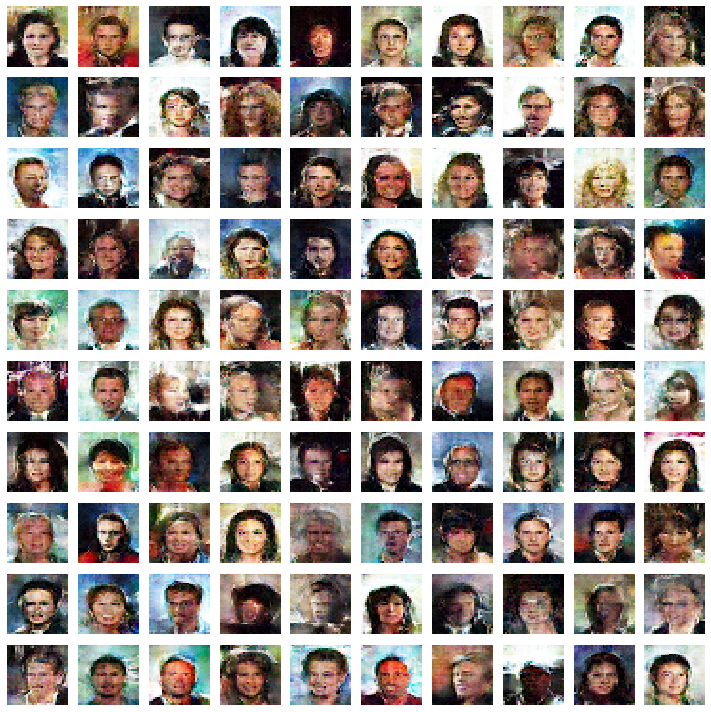

Epoch 141 Discriminator loss 0.1990  Generator loss 4.9957
Epoch 142 Discriminator loss 0.1828  Generator loss 5.8012
Epoch 143 Discriminator loss 0.1895  Generator loss 5.5678
Epoch 144 Discriminator loss 0.2059  Generator loss 5.0725
Epoch 145 Discriminator loss 0.1907  Generator loss 5.3567
Epoch 146 Discriminator loss 0.1920  Generator loss 5.3804
Epoch 147 Discriminator loss 0.2221  Generator loss 5.0947
Epoch 148 Discriminator loss 0.2347  Generator loss 4.4644
Epoch 149 Discriminator loss 0.2140  Generator loss 4.2833


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 150 Discriminator loss 0.1982  Generator loss 4.9891


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

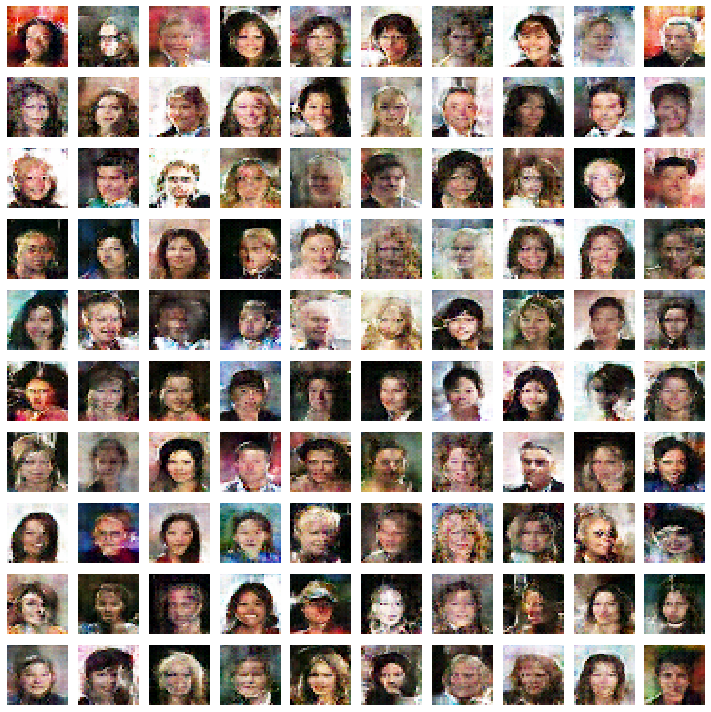

Epoch 151 Discriminator loss 0.2061  Generator loss 4.9767
Epoch 152 Discriminator loss 0.1884  Generator loss 5.1863
Epoch 153 Discriminator loss 0.1846  Generator loss 5.6905
Epoch 154 Discriminator loss 0.1789  Generator loss 5.8489
Epoch 155 Discriminator loss 0.1983  Generator loss 5.3193
Epoch 156 Discriminator loss 0.2006  Generator loss 5.1795
Epoch 157 Discriminator loss 0.1999  Generator loss 5.1364
Epoch 158 Discriminator loss 0.1998  Generator loss 5.3938
Epoch 159 Discriminator loss 0.2269  Generator loss 4.5883


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 160 Discriminator loss 0.2007  Generator loss 4.8377


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

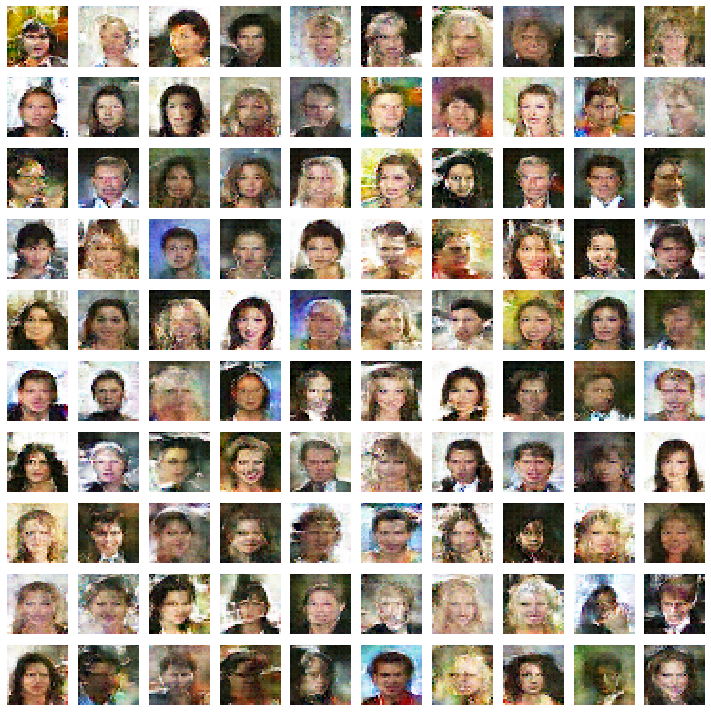

Epoch 161 Discriminator loss 0.2090  Generator loss 4.6469
Epoch 162 Discriminator loss 0.2114  Generator loss 4.8428
Epoch 163 Discriminator loss 0.1920  Generator loss 4.9524
Epoch 164 Discriminator loss 0.1868  Generator loss 5.3978
Epoch 165 Discriminator loss 0.1855  Generator loss 5.1675
Epoch 166 Discriminator loss 0.1902  Generator loss 5.5317
Epoch 167 Discriminator loss 0.2078  Generator loss 4.7283
Epoch 168 Discriminator loss 0.2045  Generator loss 4.7629
Epoch 169 Discriminator loss 0.1845  Generator loss 5.2467


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 170 Discriminator loss 0.1957  Generator loss 5.1163


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

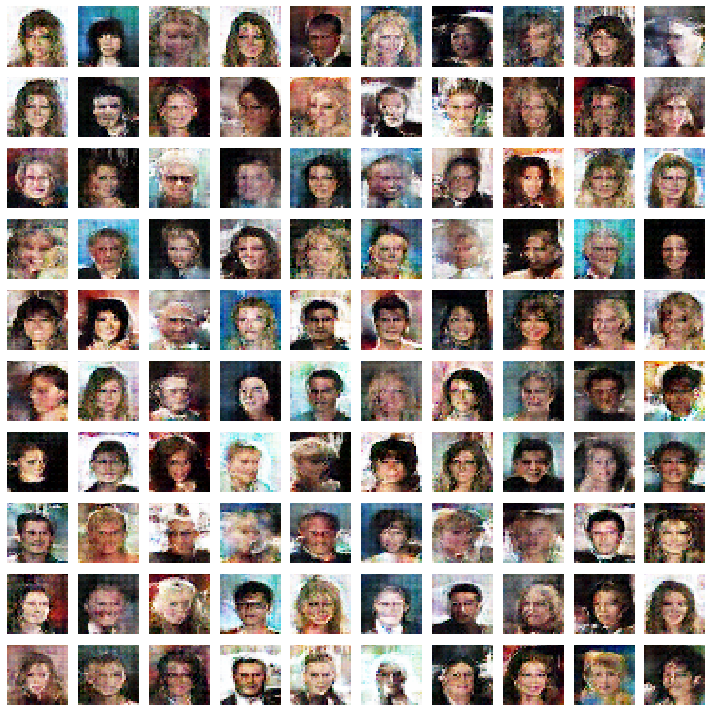

Epoch 171 Discriminator loss 0.1935  Generator loss 5.2149
Epoch 172 Discriminator loss 0.1820  Generator loss 5.9581
Epoch 173 Discriminator loss 0.2085  Generator loss 5.4125
Epoch 174 Discriminator loss 0.2136  Generator loss 4.7822
Epoch 175 Discriminator loss 0.1896  Generator loss 5.3025
Epoch 176 Discriminator loss 0.1975  Generator loss 5.2820
Epoch 177 Discriminator loss 0.1920  Generator loss 5.5244
Epoch 178 Discriminator loss 0.2223  Generator loss 4.3865
Epoch 179 Discriminator loss 0.1965  Generator loss 4.6676


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 180 Discriminator loss 0.2396  Generator loss 4.6997


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

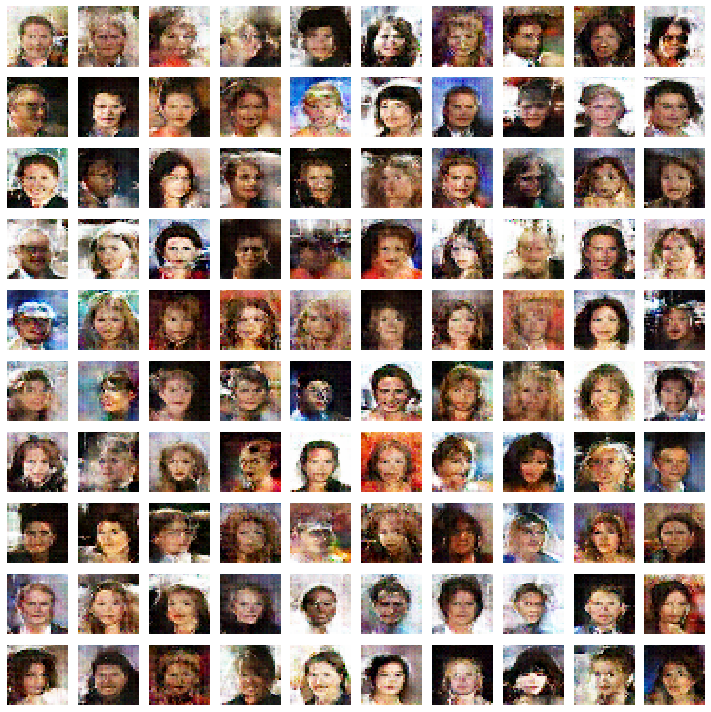

Epoch 181 Discriminator loss 0.1975  Generator loss 5.0646
Epoch 182 Discriminator loss 0.2030  Generator loss 5.1172
Epoch 183 Discriminator loss 0.1882  Generator loss 5.2592
Epoch 184 Discriminator loss 0.2003  Generator loss 5.1663
Epoch 185 Discriminator loss 0.2004  Generator loss 4.7883
Epoch 186 Discriminator loss 0.1892  Generator loss 5.1417
Epoch 187 Discriminator loss 0.1869  Generator loss 5.3126
Epoch 188 Discriminator loss 0.1763  Generator loss 5.9232
Epoch 189 Discriminator loss 0.1914  Generator loss 5.9901


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 190 Discriminator loss 0.2003  Generator loss 5.0541


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

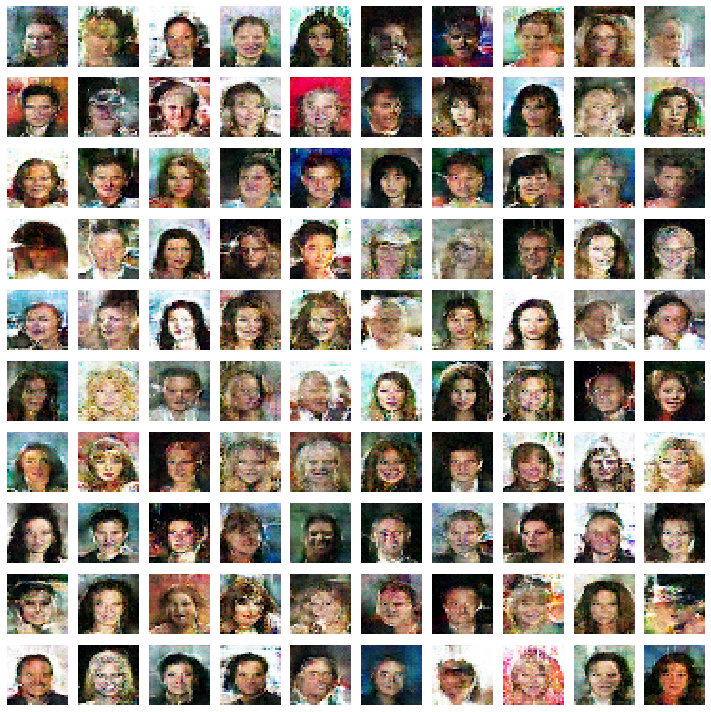

Epoch 191 Discriminator loss 0.1885  Generator loss 5.1512
Epoch 192 Discriminator loss 0.1865  Generator loss 5.5783
Epoch 193 Discriminator loss 0.1896  Generator loss 5.1846
Epoch 194 Discriminator loss 0.1825  Generator loss 5.9884
Epoch 195 Discriminator loss 0.1986  Generator loss 4.8765
Epoch 196 Discriminator loss 0.2114  Generator loss 5.0327
Epoch 197 Discriminator loss 0.1990  Generator loss 5.2186
Epoch 198 Discriminator loss 0.1992  Generator loss 5.1896
Epoch 199 Discriminator loss 0.1925  Generator loss 5.4252


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 200 Discriminator loss 0.1858  Generator loss 5.4242


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

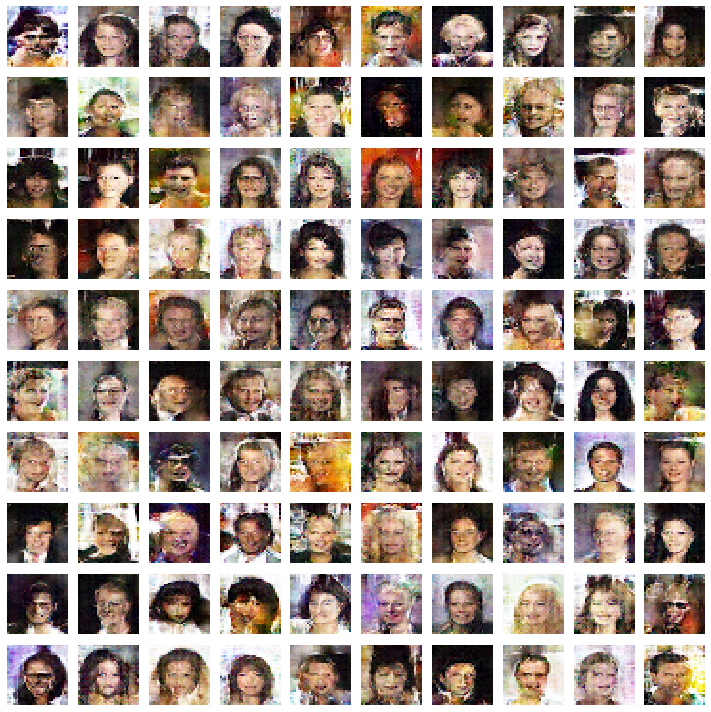

Epoch 201 Discriminator loss 0.2222  Generator loss 4.7601
Epoch 202 Discriminator loss 0.1942  Generator loss 5.0157
Epoch 203 Discriminator loss 0.1831  Generator loss 5.6656
Epoch 204 Discriminator loss 0.1932  Generator loss 5.0757
Epoch 205 Discriminator loss 0.1902  Generator loss 5.2980
Epoch 206 Discriminator loss 0.1778  Generator loss 6.2578
Epoch 207 Discriminator loss 0.1855  Generator loss 5.8434
Epoch 208 Discriminator loss 0.1836  Generator loss 6.0585
Epoch 209 Discriminator loss 0.1910  Generator loss 5.5622


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 210 Discriminator loss 0.2066  Generator loss 5.1201


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

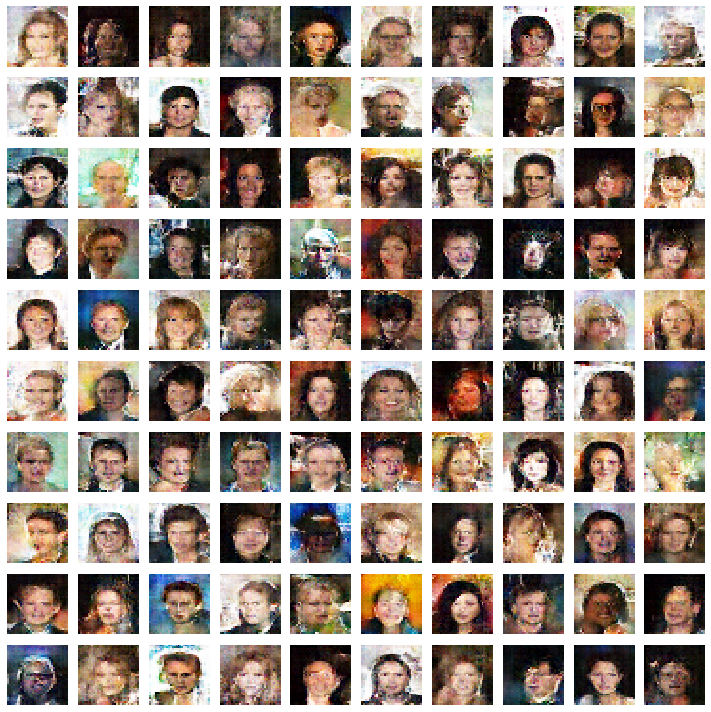

Epoch 211 Discriminator loss 0.1928  Generator loss 5.0662
Epoch 212 Discriminator loss 0.2154  Generator loss 5.2188
Epoch 213 Discriminator loss 0.2067  Generator loss 4.5995
Epoch 214 Discriminator loss 0.2037  Generator loss 5.5088
Epoch 215 Discriminator loss 0.2174  Generator loss 4.4182
Epoch 216 Discriminator loss 0.1927  Generator loss 5.2003
Epoch 217 Discriminator loss 0.1835  Generator loss 5.5959
Epoch 218 Discriminator loss 0.1962  Generator loss 5.1623
Epoch 219 Discriminator loss 0.1782  Generator loss 5.7971


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 220 Discriminator loss 0.1881  Generator loss 5.8116


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

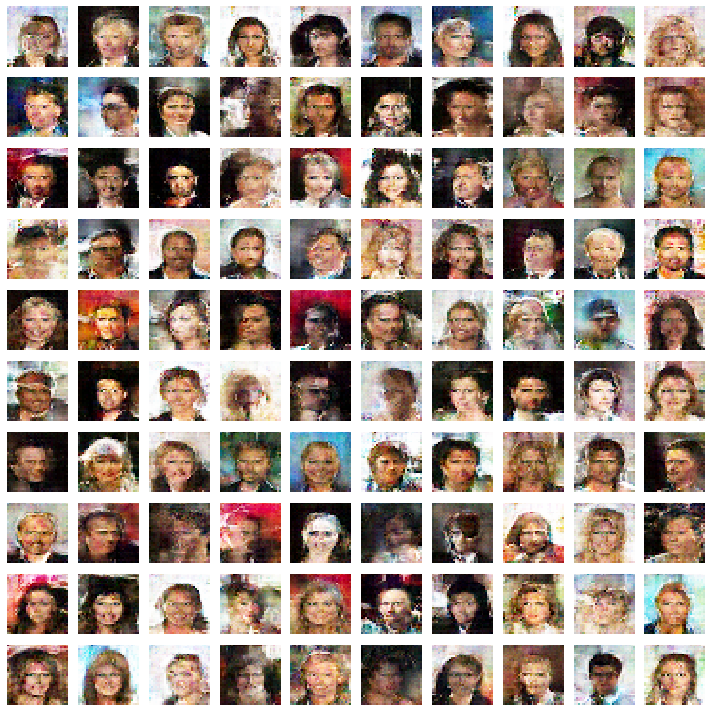

Epoch 221 Discriminator loss 0.1851  Generator loss 5.2969
Epoch 222 Discriminator loss 0.1884  Generator loss 5.4276
Epoch 223 Discriminator loss 0.1880  Generator loss 5.5222
Epoch 224 Discriminator loss 0.1860  Generator loss 5.6274
Epoch 225 Discriminator loss 0.2045  Generator loss 5.4693
Epoch 226 Discriminator loss 0.2029  Generator loss 5.1893
Epoch 227 Discriminator loss 0.2028  Generator loss 4.7564
Epoch 228 Discriminator loss 0.1829  Generator loss 5.5531
Epoch 229 Discriminator loss 0.2099  Generator loss 5.1797


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 230 Discriminator loss 0.2060  Generator loss 4.6924


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

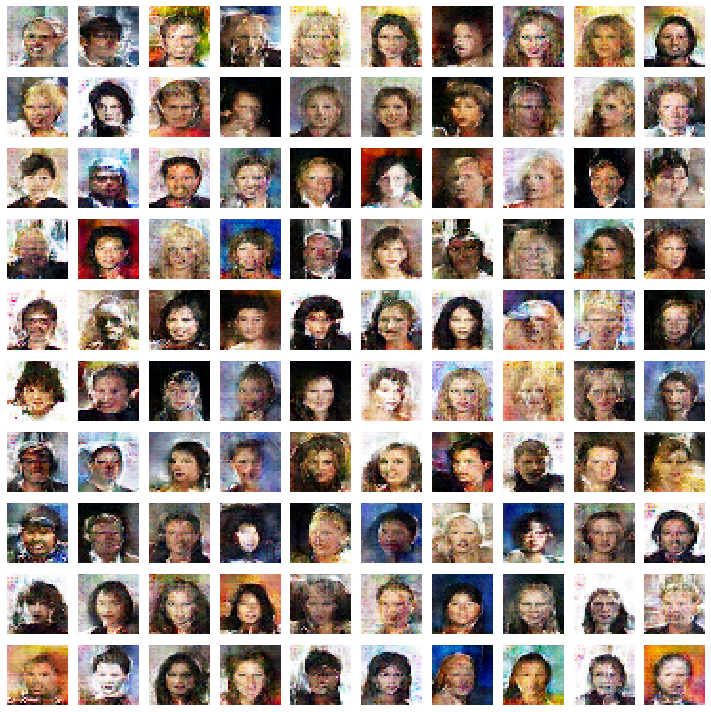

Epoch 231 Discriminator loss 0.2007  Generator loss 4.3581
Epoch 232 Discriminator loss 0.2020  Generator loss 4.8385
Epoch 233 Discriminator loss 0.1936  Generator loss 5.3105
Epoch 234 Discriminator loss 0.1828  Generator loss 5.1994
Epoch 235 Discriminator loss 0.1772  Generator loss 6.0600
Epoch 236 Discriminator loss 0.1771  Generator loss 6.2350
Epoch 237 Discriminator loss 0.1807  Generator loss 6.2804
Epoch 238 Discriminator loss 0.1843  Generator loss 5.5589
Epoch 239 Discriminator loss 0.1772  Generator loss 6.1817


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 240 Discriminator loss 0.2215  Generator loss 4.4921


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

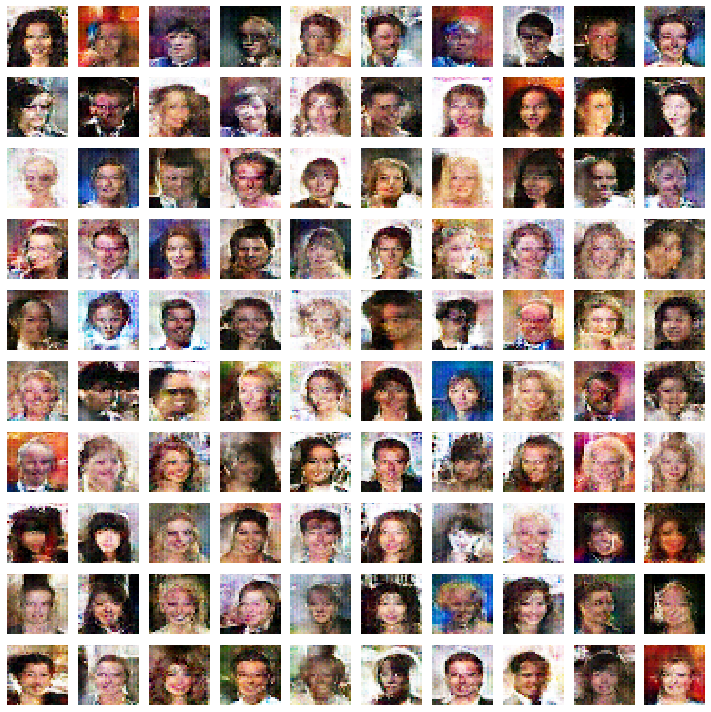

Epoch 241 Discriminator loss 0.2017  Generator loss 4.6758
Epoch 242 Discriminator loss 0.2043  Generator loss 4.7433
Epoch 243 Discriminator loss 0.2110  Generator loss 4.7417
Epoch 244 Discriminator loss 0.1973  Generator loss 5.1373
Epoch 245 Discriminator loss 0.1922  Generator loss 4.8683
Epoch 246 Discriminator loss 0.1866  Generator loss 5.2770
Epoch 247 Discriminator loss 0.2092  Generator loss 4.5037
Epoch 248 Discriminator loss 0.1776  Generator loss 5.4494
Epoch 249 Discriminator loss 0.1788  Generator loss 5.7758


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 250 Discriminator loss 0.1795  Generator loss 6.0794


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

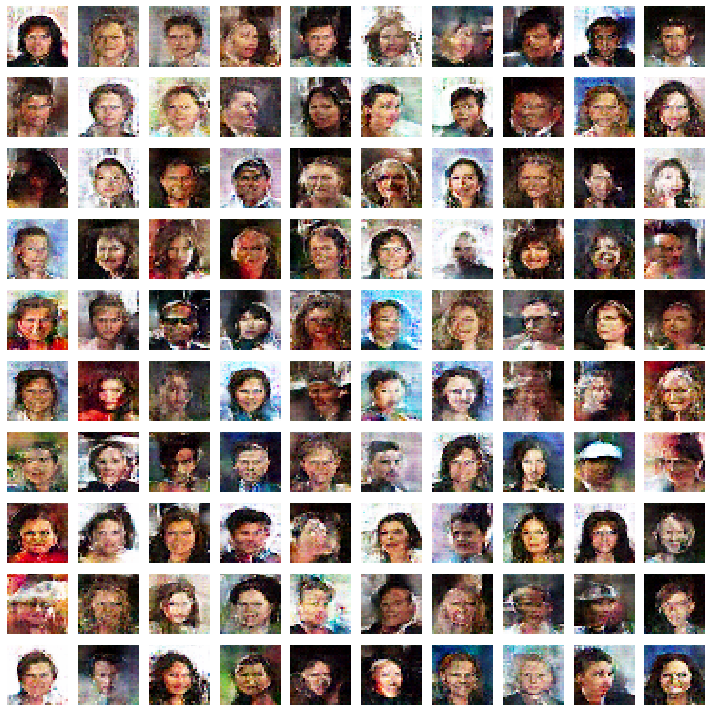

Epoch 251 Discriminator loss 0.1837  Generator loss 5.5680
Epoch 252 Discriminator loss 0.1994  Generator loss 5.0119
Epoch 253 Discriminator loss 0.1813  Generator loss 5.5322
Epoch 254 Discriminator loss 0.1773  Generator loss 5.9290
Epoch 255 Discriminator loss 0.1793  Generator loss 6.5070
Epoch 256 Discriminator loss 0.1889  Generator loss 5.5778
Epoch 257 Discriminator loss 0.1775  Generator loss 6.5670
Epoch 258 Discriminator loss 0.2119  Generator loss 4.6923
Epoch 259 Discriminator loss 0.1881  Generator loss 5.3397


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 260 Discriminator loss 0.1851  Generator loss 5.7848


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

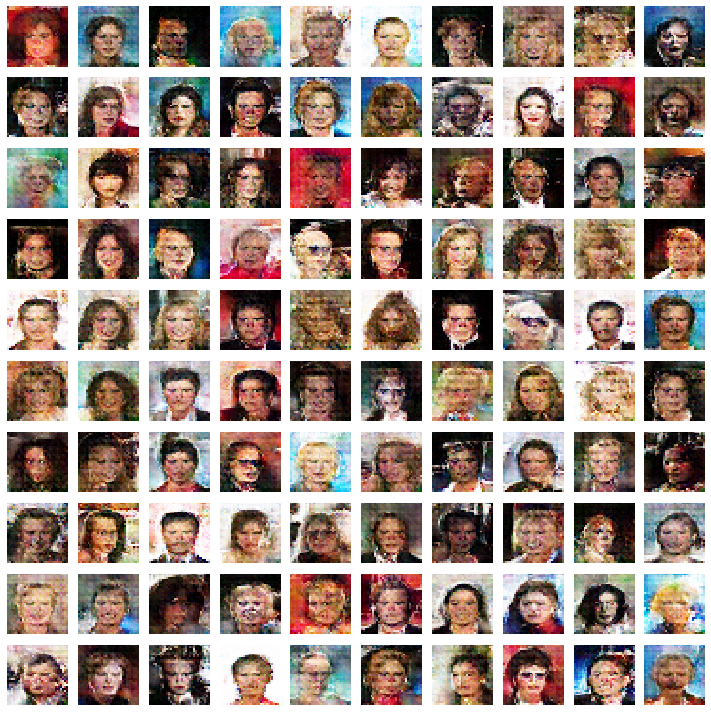

Epoch 261 Discriminator loss 0.1921  Generator loss 5.8071
Epoch 262 Discriminator loss 0.2000  Generator loss 5.0160
Epoch 263 Discriminator loss 0.1886  Generator loss 5.3856
Epoch 264 Discriminator loss 0.1860  Generator loss 5.5114
Epoch 265 Discriminator loss 0.1742  Generator loss 6.0732
Epoch 266 Discriminator loss 0.1736  Generator loss 6.5193
Epoch 267 Discriminator loss 0.1722  Generator loss 5.8253
Epoch 268 Discriminator loss 0.1730  Generator loss 5.9333
Epoch 269 Discriminator loss 0.1687  Generator loss 5.9250


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 270 Discriminator loss 0.1709  Generator loss 7.0344


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

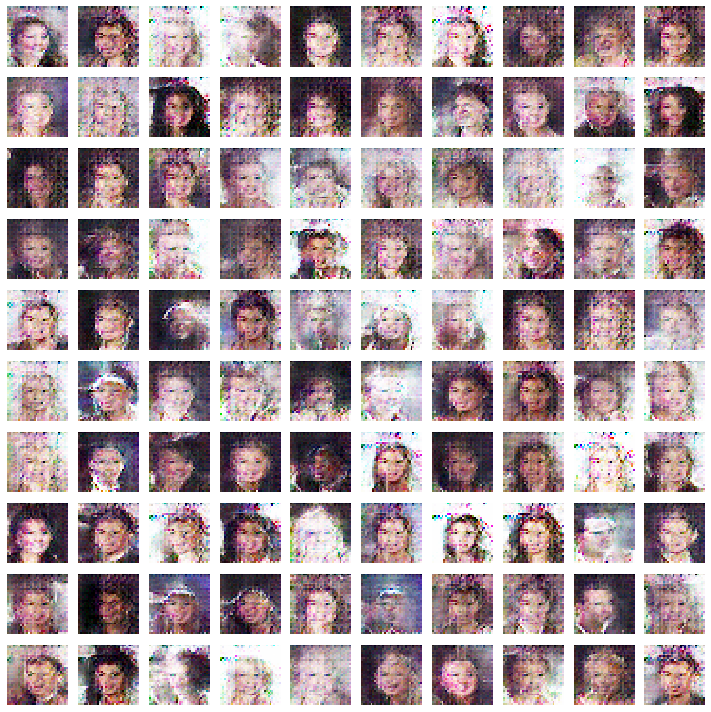

Epoch 271 Discriminator loss 0.1716  Generator loss 6.4076
Epoch 272 Discriminator loss 0.1962  Generator loss 5.5546
Epoch 273 Discriminator loss 0.1897  Generator loss 5.0672
Epoch 274 Discriminator loss 0.1969  Generator loss 5.0375
Epoch 275 Discriminator loss 0.1882  Generator loss 5.1024
Epoch 276 Discriminator loss 0.1791  Generator loss 6.1808
Epoch 277 Discriminator loss 0.1959  Generator loss 5.7224
Epoch 278 Discriminator loss 0.1849  Generator loss 5.3825
Epoch 279 Discriminator loss 0.1975  Generator loss 5.7794


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 280 Discriminator loss 0.2006  Generator loss 5.2680


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

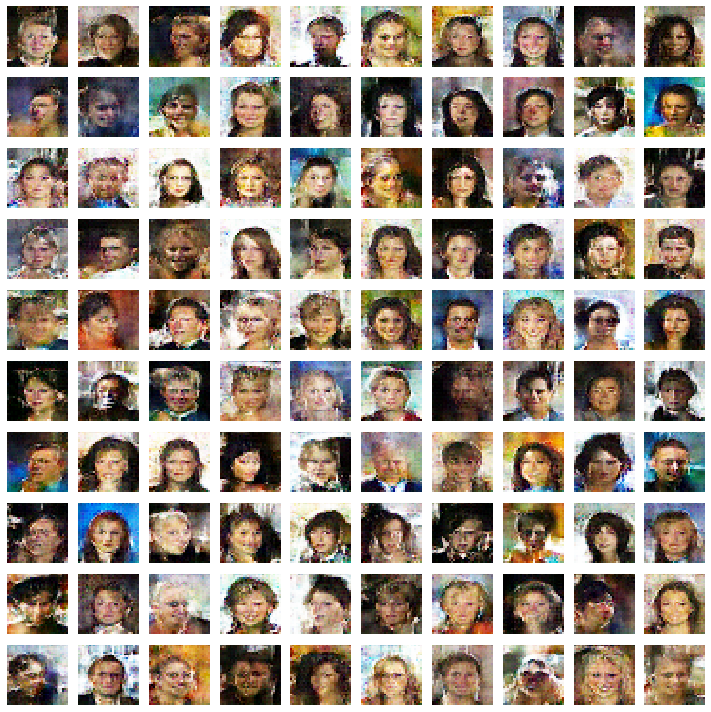

Epoch 281 Discriminator loss 0.1903  Generator loss 4.6992
Epoch 282 Discriminator loss 0.1836  Generator loss 5.5243
Epoch 283 Discriminator loss 0.1888  Generator loss 5.2230
Epoch 284 Discriminator loss 0.1827  Generator loss 5.4462
Epoch 285 Discriminator loss 0.1793  Generator loss 6.0066
Epoch 286 Discriminator loss 0.1932  Generator loss 5.2373
Epoch 287 Discriminator loss 0.1849  Generator loss 5.3295
Epoch 288 Discriminator loss 0.1785  Generator loss 6.1415
Epoch 289 Discriminator loss 0.1893  Generator loss 4.8711


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Epoch 290 Discriminator loss 0.1874  Generator loss 5.4393


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

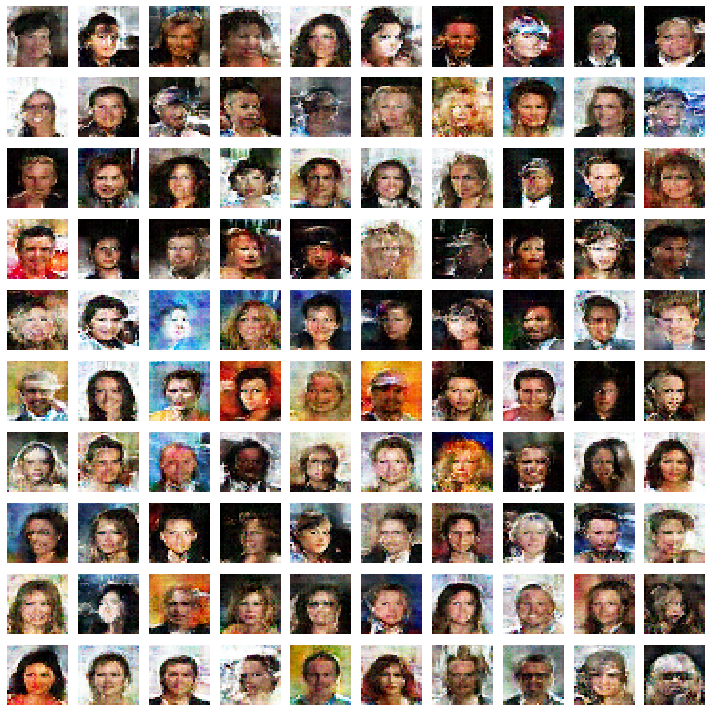

Epoch 291 Discriminator loss 0.1779  Generator loss 6.0736
Epoch 292 Discriminator loss 0.2231  Generator loss 4.6232
Epoch 293 Discriminator loss 0.1847  Generator loss 5.3431
Epoch 294 Discriminator loss 0.1776  Generator loss 6.0505
Epoch 295 Discriminator loss 0.1784  Generator loss 5.8614
Epoch 296 Discriminator loss 0.1950  Generator loss 5.2833
Epoch 297 Discriminator loss 0.1875  Generator loss 5.3500
Epoch 298 Discriminator loss 0.1748  Generator loss 6.0546
Epoch 299 Discriminator loss 0.1861  Generator loss 5.3662


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 300 Discriminator loss 0.1821  Generator loss 5.6512


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

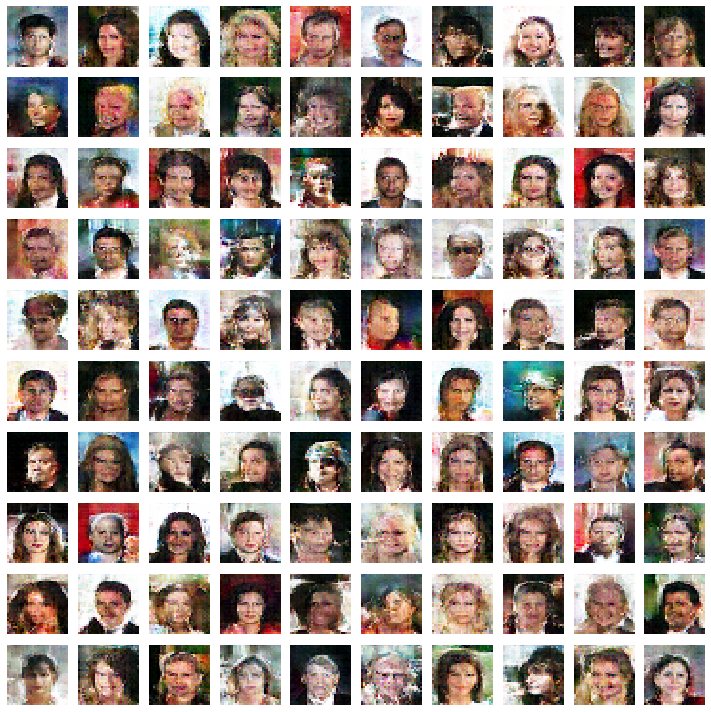

Epoch 301 Discriminator loss 0.1971  Generator loss 5.2316
Epoch 302 Discriminator loss 0.1910  Generator loss 5.3795


In [0]:
#np.shuffle(train_data)
#X_train=X_train.reshape((-1,784))
d_losses=[]
g_losses=[]
# Training loop
for epoch in range(500):
  epoch_d_loss=0
  epoch_g_loss=0
  # mini_batch SGD
  for step in range(NO_OF_BATCHES):
    # step 1: Discriminator
    # Real data+Fake data
    # real data X
    idx=np.random.randint(0,train_data.shape[0],HALF_BATCH_SIZE)
    real_imgs=train_data[idx]
    # fake imgs X
    noise=np.random.normal(0,1,size=(HALF_BATCH_SIZE,NOISE_DIM))
    fake_imgs=generator.predict(noise) # forward pass of the noise to give u some fake images.
    # to train our discriminator, we need X as well as Y values
    # labels
    real_y=np.ones((HALF_BATCH_SIZE,1))*0.9
    fake_y=np.zeros((HALF_BATCH_SIZE,1))
    # Train our discriminator
    d_loss_real=discriminator.train_on_batch(real_imgs,real_y)
    d_loss_fake=discriminator.train_on_batch(fake_imgs,fake_y)
    d_loss=0.5*d_loss_real+0.5*d_loss_fake

    epoch_d_loss+=d_loss
    # Train Generator(Considering frozen discriminator)
    noise=np.random.normal(0,1,size=(BATCH_SIZE,NOISE_DIM))
    ground_truth_y=np.ones((BATCH_SIZE,1))
    g_loss=model.train_on_batch(noise,ground_truth_y)
    epoch_g_loss+=g_loss
    d_losses.append(epoch_d_loss/NO_OF_BATCHES)
    g_losses.append(epoch_g_loss/NO_OF_BATCHES)
  print("Epoch %d Discriminator loss %.4f  Generator loss %.4f"%(epoch+1,epoch_d_loss/NO_OF_BATCHES,epoch_g_loss/NO_OF_BATCHES))
  if (epoch+1)%10==0:
        #generator.save('model/gan_generator_{0}.h5'.format(epoch+1))
        save_imgs(epoch)